In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from superRes.metrics import *


import torchvision
import geffnet # efficient/ mobile net

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=7)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_256 = path/'DIV2K_train_LR_256_QF20'
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
path_lowRes_Full = path/'DIV2K_train_LR_Full_QF20'

proj_id = 'unet_superRes_mobilenetV3_SSIM'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

torch.Size([3, 731, 512])


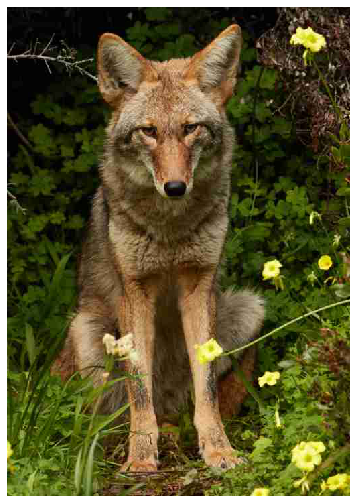

In [4]:
il = ImageList.from_folder(path_lowRes_512)
print(il[10].shape)
il[10].show(figsize=(9,9))

In [5]:
model = geffnet.mobilenetv3_rw
# model = models.resnet34
# model= geffnet.efficientnet_b4

In [6]:
# loss_func = FeatureLoss()
loss_func = msssim
# loss_func = calculate_frechet_distance

# 256px

In [7]:
bs=5
sz=256
lr = 1e-2
wd = 1e-3
epochs = 1

In [8]:
data_gen = get_DIV2k_data_QF(path_lowRes_256, path_fullRes, bs=bs, sz=sz)

In [9]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [10]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [11]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="gen_mobilenetV3_SSIM"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


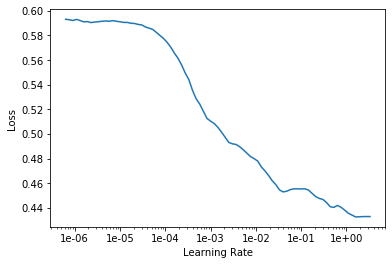

In [12]:
learn_gen.lr_find()
learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.102140,0.043817,0.692201,0.695172,0.164992,0.159935,83.393639,81.962106,79.666401,20.903671,20.969023,19.456907,02:03


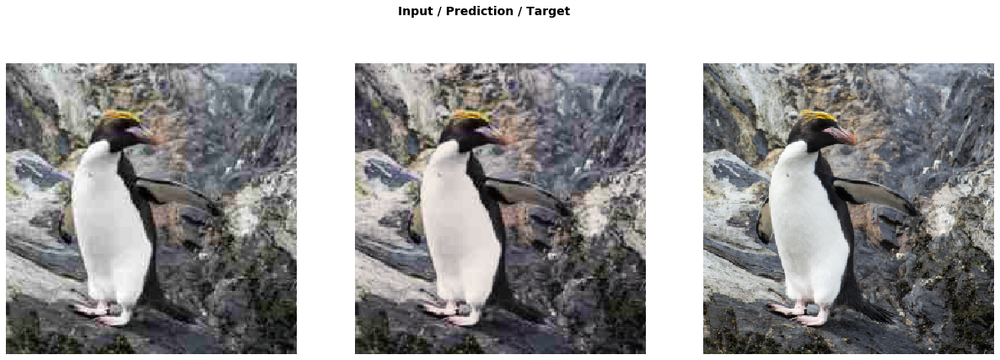

In [13]:
do_fit(learn_gen, epochs, gen_name+"_256px_0", slice(lr*10))

In [14]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.053655,0.037111,0.693024,0.695172,0.161307,0.159935,84.015128,81.962106,79.666401,20.668612,20.969023,19.456907,01:58
1,0.053136,0.152431,0.578026,0.695172,0.274128,0.159935,86.017165,81.962106,79.666401,25.859482,20.969023,19.456907,01:57
2,0.051949,0.096217,0.601069,0.695172,0.234027,0.159935,79.006072,81.962106,79.666401,25.008806,20.969023,19.456907,01:58
3,0.050681,0.102967,0.669928,0.695172,0.205609,0.159935,85.499932,81.962106,79.666401,20.988235,20.969023,19.456907,01:58
4,0.050708,0.035902,0.697515,0.695172,0.162461,0.159935,81.882588,81.962106,79.666401,21.003040,20.969023,19.456907,02:02


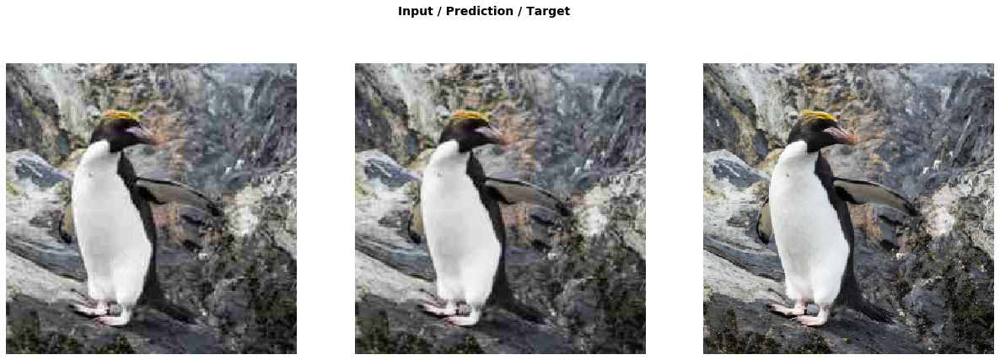

In [15]:
do_fit(learn_gen, 5, gen_name+"_256px_1", lr)

# 512px

In [16]:
bs=4
sz=512
epochs = 5

In [18]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [19]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

20576

In [ ]:
# learn_gen.load(gen_name+"_256px_0")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


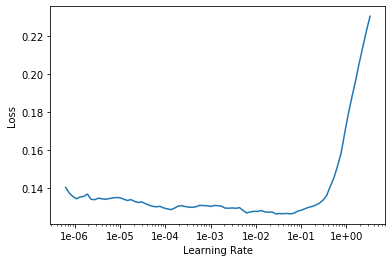

In [26]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.053404,0.040047,0.702776,0.707517,0.181568,0.176500,86.563968,87.354943,85.322157,17.571545,17.860744,15.693551,11:55


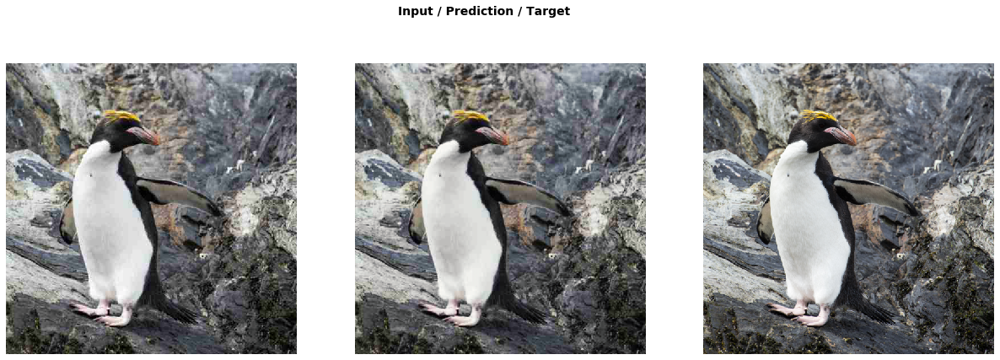

In [20]:
print("Upsize to gen_512")

do_fit(learn_gen, 1, gen_name+"_512px_0", 1e-3)

In [21]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.053842,0.037690,0.711115,0.707517,0.175648,0.176500,87.787126,87.354943,85.322157,17.690075,17.860744,15.693551,11:43
1,0.053134,0.039419,0.705121,0.707517,0.180206,0.176500,86.980645,87.354943,85.322157,17.558016,17.860744,15.693551,11:40
2,0.052585,0.037745,0.710226,0.707517,0.176613,0.176500,87.518768,87.354943,85.322157,17.688522,17.860744,15.693551,12:02


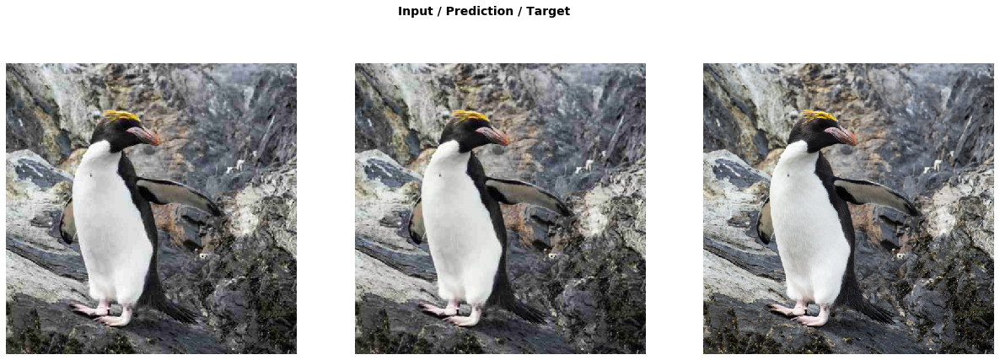

In [22]:
do_fit(learn_gen, 3, gen_name+"_512px_1", slice(1e-3))

In [23]:
bs=2
sz=512
epochs = 1

path_lowRes_512 = path/'DIV2K_train_LR_512_QF35'

In [24]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [25]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

12970

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.039746,0.031998,0.744605,0.765970,0.141027,0.116126,84.387832,86.647863,85.322157,17.087870,17.414343,15.693551,08:04


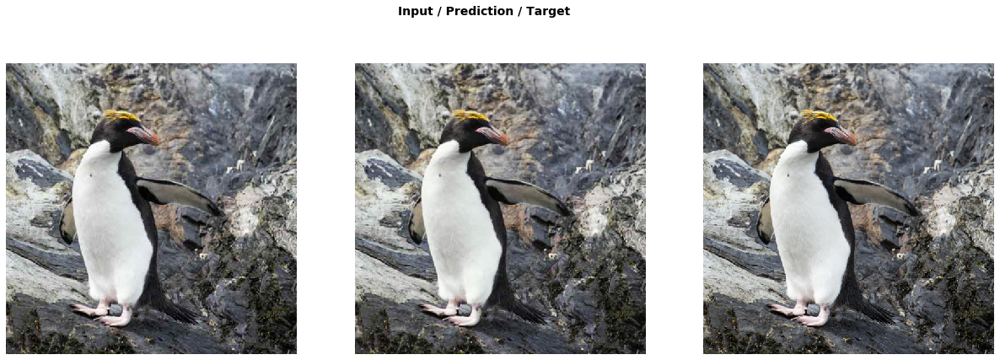

In [26]:
do_fit(learn_gen, 1, gen_name+"_512px_2", 1e-3)

In [27]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.038642,0.032182,0.739831,0.765970,0.142471,0.116126,83.512337,86.647863,85.322157,16.998327,17.414343,15.693551,08:25
1,0.037763,0.031809,0.742880,0.765970,0.142064,0.116126,83.741802,86.647863,85.322157,17.086708,17.414343,15.693551,08:25
2,0.038872,0.032314,0.746340,0.765970,0.140176,0.116126,84.181532,86.647863,85.322157,17.174049,17.414343,15.693551,08:55


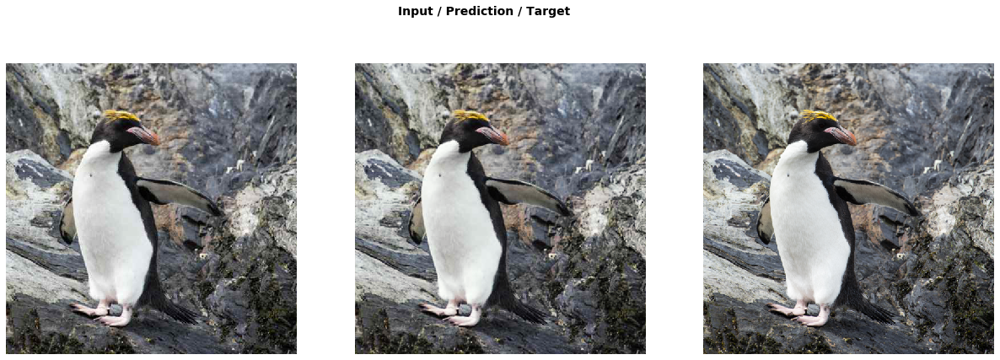

In [28]:
do_fit(learn_gen, 3, gen_name+"_512px_3", slice(1e-3))

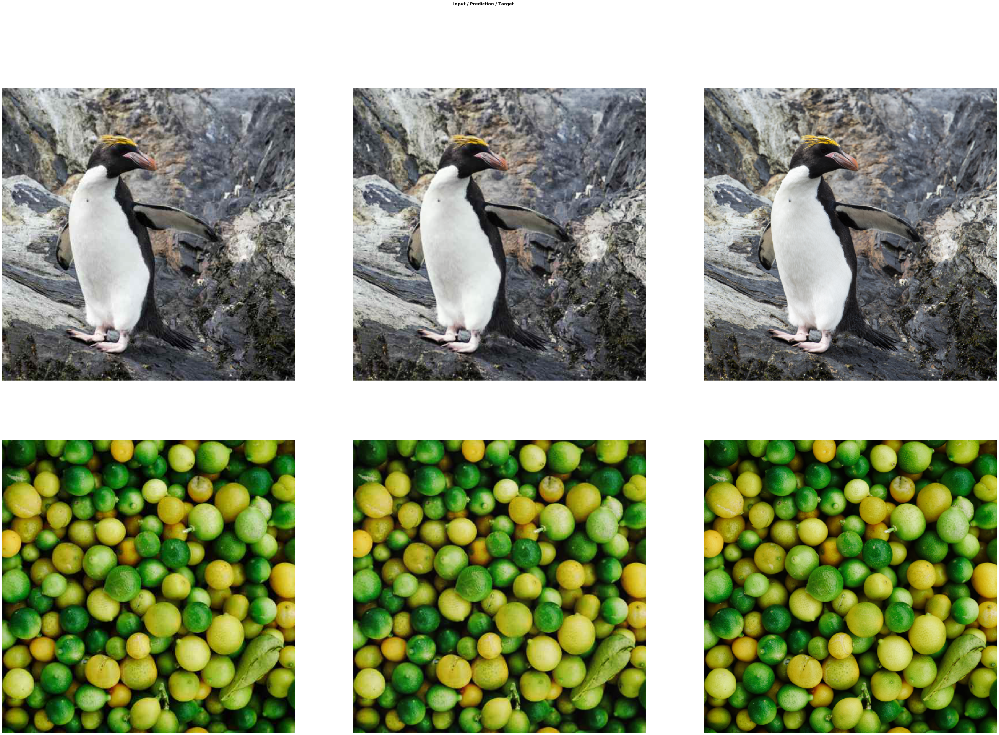

In [29]:
learn_gen.show_results(rows=10, imgsize=20)

In [30]:
bs=1
sz=512
epochs = 1

In [31]:
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
size=( 512, 680)

In [32]:
data_1k = (ImageImageList.from_folder(path_lowRes_512, presort=True).split_by_idxs(
            train_idx=list(range(0, 800)), valid_idx=list(range(800, 900)))
          .label_from_func(lambda x: path_fullRes/x.name.replace(".jpg", ".png"))
          .transform(get_transforms(), size=size, tfm_y=True)
          .databunch(bs=1).normalize(imagenet_stats, do_y=True))
data_1k.c = 3

In [33]:
learn_gen.data = data_1k
learn_gen.freeze()
gc.collect()

25867

In [34]:
fn = data_1k.valid_dl.x.items[2]; fn

PosixPath('dataset/DIV2K_train_LR_512_QF20/0803.jpg')

In [35]:
img = open_image(fn); print(img.shape)
p,img_hr,b = learn_gen.predict(img)

torch.Size([3, 512, 680])


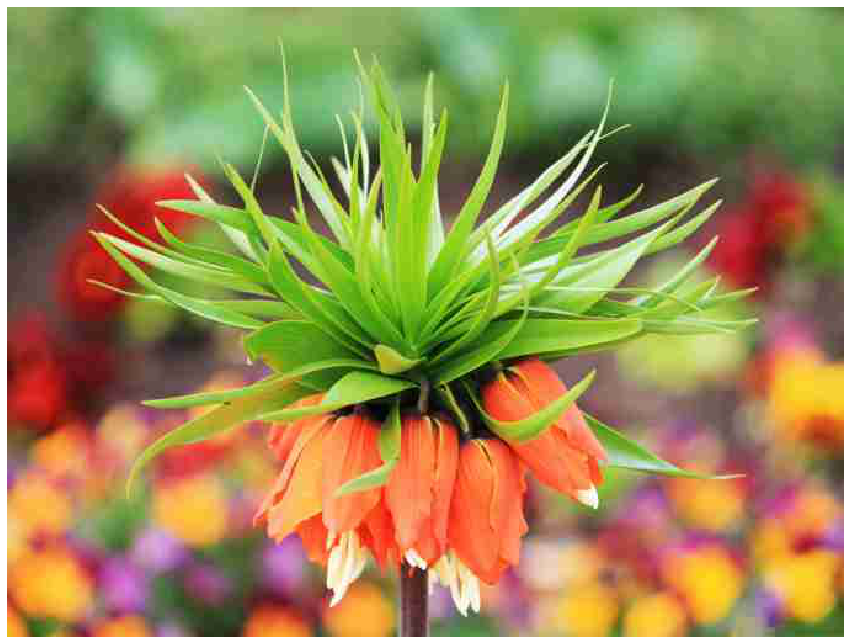

In [36]:
show_image(img, figsize=(15,15), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


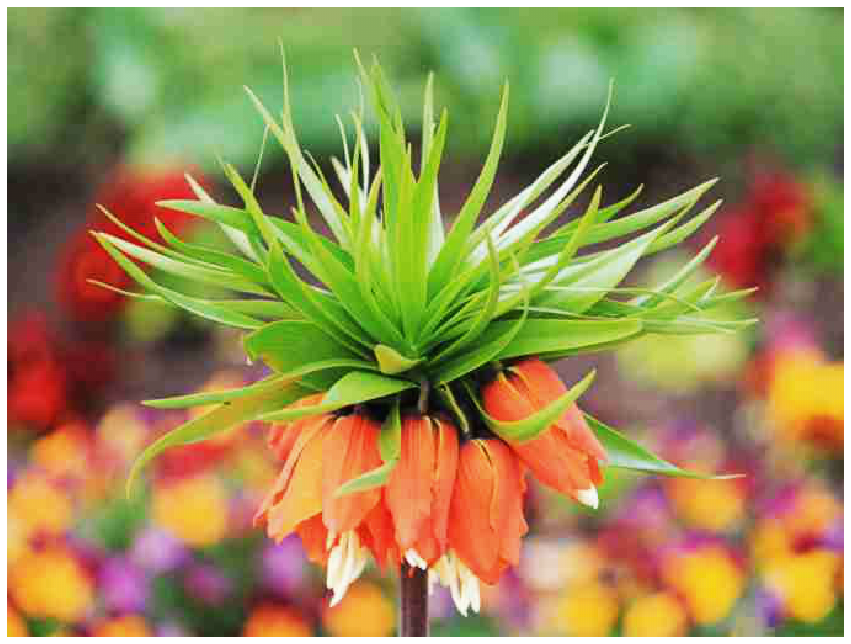

In [37]:
Image(img_hr).show(figsize=(15,15))

In [ ]:
learn_gen = None
gc.collect()